# Import Victoria Crime Data

### Import Required Libraries


In [40]:
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### Download CSV file

In [41]:
url = 'https://raw.githubusercontent.com/AshVJ/Capstone_Final_Project/master/VICCrimeData.csv'
df = pd.read_csv(url, error_bad_lines=False)
df.shape

(34038, 8)

In [42]:
df.head()

,Year,Area,Postcode,Suburb,Offence Division,Offence Subdivision,Offence Subgroup,Incidents Recorded
0,2019,Alpine,3691,Dederang,A Crimes against the person,A20 Assault and related offences,A212 Non-FV Serious assault,1
1,2019,Alpine,3691,Dederang,A Crimes against the person,Other crimes against the person,Other crimes against the person,1
2,2019,Alpine,3691,Dederang,B Property and deception offences,B20 Property damage,B21 Criminal damage,1
3,2019,Alpine,3691,Dederang,B Property and deception offences,B30 Burglary/Break and enter,B321 Residential non-aggravated burglary,1
4,2019,Alpine,3691,Dederang,B Property and deception offences,B40 Theft,B49 Other theft,1


### Remove columns which are not really necessary

In [43]:
df.drop(["Year", "Area", "Postcode", "Offence Subdivision", "Offence Subgroup"], axis=1, inplace=True)
df.shape

(34038, 3)

In [44]:
df.head()

,Suburb,Offence Division,Incidents Recorded
0,Dederang,A Crimes against the person,1
1,Dederang,A Crimes against the person,1
2,Dederang,B Property and deception offences,1
3,Dederang,B Property and deception offences,1
4,Dederang,B Property and deception offences,1


In [45]:
df.shape

(34038, 3)

### We need to cleanse the data and pivot/sub-total them as there will be duplicates

In [46]:
df.rename(columns={"Offence Division": "Offence", "Incidents Recorded": "Incidents"}, inplace=True)

In [47]:
df.dtypes

Suburb       object
Offence      object
Incidents    object
dtype: object

In [48]:
#Convert the contents of incidents into float, but first remove ,

df.Incidents = df.Incidents.str.replace(",", "")

In [49]:
#Replace all NAN values to 0
df = df.dropna(subset=['Incidents'])

df.dtypes

Suburb       object
Offence      object
Incidents    object
dtype: object

In [50]:
df["Incidents"] = df["Incidents"].astype(int)
df.dtypes

Suburb       object
Offence      object
Incidents     int64
dtype: object

In [51]:
# lets group the data to remove duplicates

df = df.groupby(['Suburb','Offence'])['Incidents'].sum().reset_index()
df.shape

(7470, 3)

In [52]:
df.head()

,Suburb,Offence,Incidents
0,Abbeyard,B Property and deception offences,1
1,Abbotsford,A Crimes against the person,137
2,Abbotsford,B Property and deception offences,891
3,Abbotsford,C Drug offences,68
4,Abbotsford,D Public order and security offences,80


### Download the latitude and longitude data

In [53]:
url2 = 'https://raw.githubusercontent.com/AshVJ/Capstone_Final_Project/master/VicLatLongCSV.csv'
df_ll = pd.read_csv(url2, error_bad_lines=False)
df_ll.shape

(3322, 3)

### Create a new data set with latitude and longitude to map onto foursquare


In [54]:
# First find the columns names

df.head()

,Suburb,Offence,Incidents
0,Abbeyard,B Property and deception offences,1
1,Abbotsford,A Crimes against the person,137
2,Abbotsford,B Property and deception offences,891
3,Abbotsford,C Drug offences,68
4,Abbotsford,D Public order and security offences,80


In [55]:
df_ll.head()

,Locality,Latitude,Longitude
0,BENNISON,-39.140761,146.360412
1,BOOLARONG,-39.140761,146.360412
2,FOSTER,-39.140761,146.360412
3,FOSTER NORTH,-39.140761,146.360412
4,GUNYAH,-39.140761,146.360412


In [56]:
#as you can  see the column case sensitivity doesn't match across the data frames, so lets fix locatity data frame

df_ll['Locality'] = df_ll['Locality'].str.upper()
df['Suburb'] = df['Suburb'].str.upper()

In [57]:
#the case has now been fixed

df.head()

,Suburb,Offence,Incidents
0,ABBEYARD,B Property and deception offences,1
1,ABBOTSFORD,A Crimes against the person,137
2,ABBOTSFORD,B Property and deception offences,891
3,ABBOTSFORD,C Drug offences,68
4,ABBOTSFORD,D Public order and security offences,80


### Merge columns

In [58]:
#next step is to merge both data sets to get lat and long on our crimes data

df_viccrimedata =  df.merge(df_ll, left_on='Suburb', right_on='Locality', how='left')

In [59]:
#we can also see the data in suburb acrosss both data
#df_ll.head()
df_viccrimedata.head(10)

,Suburb,Offence,Incidents,Locality,Latitude,Longitude
0,ABBEYARD,B Property and deception offences,1,ABBEYARD,-36.554037,146.827590
1,ABBOTSFORD,A Crimes against the person,137,ABBOTSFORD,-37.803515,144.998203
2,ABBOTSFORD,B Property and deception offences,891,ABBOTSFORD,-37.803515,144.998203
3,ABBOTSFORD,C Drug offences,68,ABBOTSFORD,-37.803515,144.998203
4,ABBOTSFORD,D Public order and security offences,80,ABBOTSFORD,-37.803515,144.998203
5,ABBOTSFORD,E Justice procedures offences,81,ABBOTSFORD,-37.803515,144.998203
6,ABBOTSFORD,F Other offences,3,ABBOTSFORD,-37.803515,144.998203
7,ABERFELDIE,A Crimes against the person,18,ABERFELDIE,-37.751845,144.902556
8,ABERFELDIE,B Property and deception offences,72,ABERFELDIE,-37.751845,144.902556
9,ABERFELDIE,C Drug offences,5,ABERFELDIE,-37.751845,144.902556


In [60]:
#check if there are any column with null values before proceeding

df_viccrimedata.isnull().sum()

Suburb       0
Offence      0
Incidents    0
Locality     0
Latitude     0
Longitude    0
dtype: int64

In [61]:
#Remove column locality in data frame

df_viccrimedata.drop(["Locality"], axis=1, inplace=True)
df_viccrimedata.head()

,Suburb,Offence,Incidents,Latitude,Longitude
0,ABBEYARD,B Property and deception offences,1,-36.554037,146.827590
1,ABBOTSFORD,A Crimes against the person,137,-37.803515,144.998203
2,ABBOTSFORD,B Property and deception offences,891,-37.803515,144.998203
3,ABBOTSFORD,C Drug offences,68,-37.803515,144.998203
4,ABBOTSFORD,D Public order and security offences,80,-37.803515,144.998203


### Another method to find latitude and longitudes

In [33]:
# lets find coordinates for suburbs in df

!conda install -c conda-forge geopandas --yes
!conda install -c conda-forge geopy --yes

Solving environment: \ ^C
Solving environment: | ^C
failed

CondaError: KeyboardInterrupt



In [114]:
#We can also use other methods to extract latitude longitude
#in the  below example, we have  use geopy to get the lat longg

# Retrieve the Latitude and Longitude for Paris
from geopy.geocoders import Nominatim 

address1 = 'Melbourne'
address2 = 'ABBEYARD'

# Define the user_agent as Paris_explorer
geolocator = Nominatim(user_agent="VIC_explorer")

location = geolocator.geocode(address2)
latitude = location.latitude
longitude = location.longitude

print('The geographical coordinates of Abbeyard Victoria  - Australia are {}, {}.'.format(latitude, longitude))

location = geolocator.geocode(address1)
latitude = location.latitude
longitude = location.longitude

print('The geographical coordinates of Melbourne Australia are {}, {}.'.format(latitude, longitude))



The geographical coordinates of Abbeyard Victoria  - Australia are -36.9120375, 146.6998168.
The geographical coordinates of Melbourne Australia are -37.8142176, 144.9631608.


## Exploratory Data Analysis

### Descriptive statistics of Crime Data

In [62]:
df.describe()

,Incidents
count,7470.000000
mean,52.972959
std,198.133061
min,1.000000
25%,1.000000
50%,4.000000
75%,23.000000
max,8235.000000


In [63]:
# Download matlib for data presentation
# use the inline backend to generate the plots within the browser
%matplotlib inline 

import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.style.use('ggplot') # optional: for ggplot-like style

# check for latest version of Matplotlib
print ('Matplotlib version: ', mpl.__version__) # >= 2.0.0

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

Matplotlib version:  3.1.1


### Consolidated Victoria Crime Data

In [64]:
#Lets create a new crimes data frame to consolidate the numbers of incides irrespective of the type of crime
# we will still need the actual data set for our future analysis

df_viccrime_cons = df_viccrimedata[['Suburb','Incidents','Latitude', 'Longitude']].copy()

In [65]:
df_viccrime_cons.head()

,Suburb,Incidents,Latitude,Longitude
0,ABBEYARD,1,-36.554037,146.827590
1,ABBOTSFORD,137,-37.803515,144.998203
2,ABBOTSFORD,891,-37.803515,144.998203
3,ABBOTSFORD,68,-37.803515,144.998203
4,ABBOTSFORD,80,-37.803515,144.998203


In [66]:
# we do another group by suburbs

df_viccrime_cons = df_viccrime_cons.groupby(['Suburb','Latitude', 'Longitude'])['Incidents'].sum().reset_index()
df_viccrime_cons.shape

(2345, 4)

In [67]:
df_viccrime_cons.head()

,Suburb,Latitude,Longitude,Incidents
0,ABBEYARD,-36.554037,146.827590,1
1,ABBOTSFORD,-37.803515,144.998203,1260
2,ABERFELDIE,-37.751845,144.902556,109
3,ACHERON,-37.210538,145.687889,4
4,ADAMS ESTATE,-38.312647,145.563979,2


### To target our target audience, let us consider the top 307 suburbs liveable

#### Download list of suburbs from domain.com.au for 2019

In [68]:
#Download data from https://www.domain.com.au/liveable-melbourne/melbournes-most-liveable-suburbs-2019/melbournes-307-suburbs-ranked-for-liveability-2019-898676/
url3 = 'https://raw.githubusercontent.com/AshVJ/Capstone_Final_Project/master/Top307VicSuburbsDomain.csv'
df_top307 = pd.read_csv(url3, error_bad_lines=False)
df_top307.shape


(307, 2)

In [69]:
df_top307.head()

,Ranking,Suburb
0,1,South Yarra
1,2,East Melbourne
2,3,Carlton
3,4,Fitzroy North
4,5,Hawthorn


In [70]:
df_top307['Suburb'] = df_top307['Suburb'].str.upper()
df_top307.head()

,Ranking,Suburb
0,1,SOUTH YARRA
1,2,EAST MELBOURNE
2,3,CARLTON
3,4,FITZROY NORTH
4,5,HAWTHORN


In [73]:
#let us use the subset to get lat long and incidents

df_307CrimeData =  df_top307.merge(df, left_on='Suburb', right_on='Suburb', how='left')

df_307CrimeData.drop(["Ranking"], axis=1, inplace=True)
df_307CrimeData.head()

,Suburb,Offence,Incidents
0,SOUTH YARRA,A Crimes against the person,292.0
1,SOUTH YARRA,B Property and deception offences,1545.0
2,SOUTH YARRA,C Drug offences,91.0
3,SOUTH YARRA,D Public order and security offences,108.0
4,SOUTH YARRA,E Justice procedures offences,167.0


In [74]:
df_307CrimeData.shape

(1389, 3)

In [76]:
#check if there are any column with null values before proceeding

df_307CrimeData.loc[df_307CrimeData['Incidents'].isnull()]
df_307CrimeData.isnull().sum()

#Let us drop where the values don't match
df_307CrimeData = df_307CrimeData.dropna(subset=['Incidents'])


In [77]:
df_307CrimeData.shape

(1326, 3)

### We have now successfully come down from 34K+ records to less than 1.3K records. This is a good data set to use

In [78]:
df_307CrimeData.head()

,Suburb,Offence,Incidents
0,SOUTH YARRA,A Crimes against the person,292.0
1,SOUTH YARRA,B Property and deception offences,1545.0
2,SOUTH YARRA,C Drug offences,91.0
3,SOUTH YARRA,D Public order and security offences,108.0
4,SOUTH YARRA,E Justice procedures offences,167.0


### Lets now merge latitude and longitude data

In [79]:
df_307CrimeData =  df_307CrimeData.merge(df_ll, left_on='Suburb', right_on='Locality', how='left')
df_307CrimeData.drop(['Locality'], axis=1, inplace=True)
df_307CrimeData.head()

,Suburb,Offence,Incidents,Latitude,Longitude
0,SOUTH YARRA,A Crimes against the person,292.0,-37.840679,144.991264
1,SOUTH YARRA,B Property and deception offences,1545.0,-37.840679,144.991264
2,SOUTH YARRA,C Drug offences,91.0,-37.840679,144.991264
3,SOUTH YARRA,D Public order and security offences,108.0,-37.840679,144.991264
4,SOUTH YARRA,E Justice procedures offences,167.0,-37.840679,144.991264


In [80]:
df_307CrimeData.shape

(1326, 5)

### Analyse Suburb and Crime Data

### Sort crimes in descending order to find the highest crime zone

In [84]:
#df_viccrime_cons.sort_values(['Incidents'], ascending = False, axis = 0, inplace = True)

df_viccrime_bad = df_307CrimeData.drop(["Latitude", "Longitude"], axis=1)
df_viccrime_bad = df_viccrime_bad.groupby(['Suburb'])['Incidents'].sum().reset_index()
df_viccrime_bad = df_viccrime_bad.sort_values(['Incidents'], ascending = False, axis = 0)
df_viccrime_bad10 = df_viccrime_bad.head(10)
df_viccrime_bad10

,Suburb,Incidents
149,MELBOURNE,15834.0
67,DANDENONG,6087.0
234,WERRIBEE,3514.0
206,ST KILDA,3344.0
183,RICHMOND,3308.0
204,ST ALBANS,2912.0
29,BROADMEADOWS,2879.0
200,SOUTHBANK,2816.0
87,EPPING,2772.0
184,RINGWOOD,2648.0


### Visualise the top 10 suburbs with the highest number of crimes

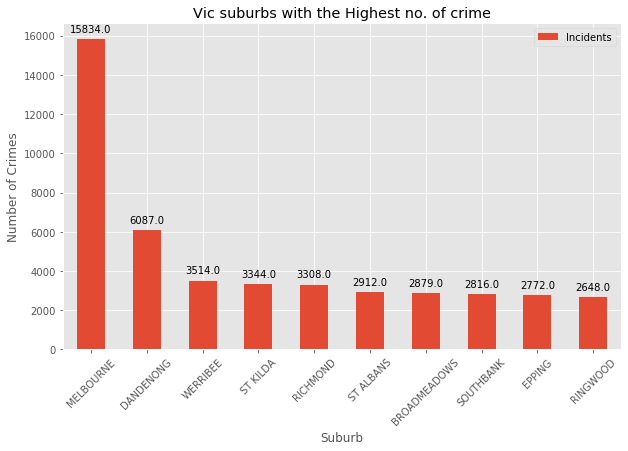

In [85]:
df_4plot1 = df_viccrime_bad10[['Suburb','Incidents']]

df_4plot1.set_index('Suburb',inplace = True)

ax = df_4plot1.plot(kind='bar', figsize=(10, 6), rot=0)

ax.set_ylabel('Number of Crimes') # add to x-label to the plot
ax.set_xlabel('Suburb') # add y-label to the plot
ax.set_title('Vic suburbs with the Highest no. of crime') # add title to the plot

# Creating a function to display the percentage.

for p in ax.patches:
    ax.annotate(np.round(p.get_height(),decimals=2), 
                (p.get_x()+p.get_width()/2., p.get_height()), 
                ha='center', 
                va='center', 
                xytext=(0, 10), 
                textcoords='offset points',
                fontsize = 10
               )

plt.xticks(rotation=45)
plt.show()

### The learning here is phenomenal, but understandable. Coming from Melbourne, I understand the population and people of Melbourne are dynamic due to its urban/cosmopolition nature

#### Lets visualise top 50 suburbs in melbourne to understand how they tracked

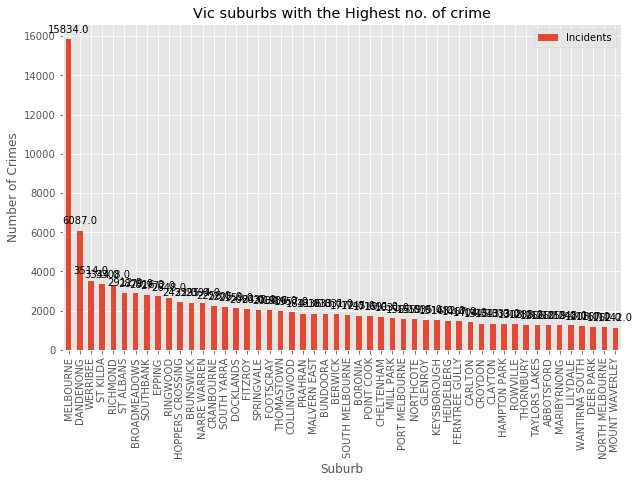

In [86]:
df_viccrime_bad50 = df_viccrime_bad.head(50)

df_4plot1 = df_viccrime_bad50[['Suburb','Incidents']]

df_4plot1.set_index('Suburb',inplace = True)

ax = df_4plot1.plot(kind='bar', figsize=(10, 6), rot=0)

ax.set_ylabel('Number of Crimes') # add to x-label to the plot
ax.set_xlabel('Suburb') # add y-label to the plot
ax.set_title('Vic suburbs with the Highest no. of crime') # add title to the plot

# Creating a function to display the percentage.

for p in ax.patches:
    ax.annotate(np.round(p.get_height(),decimals=2), 
                (p.get_x()+p.get_width()/2., p.get_height()), 
                ha='center', 
                va='center', 
                xytext=(0, 10), 
                textcoords='offset points',
                fontsize = 10
               )

plt.xticks(rotation=90)
plt.show()

### Lets look at various crime categories now

#### the dataset with all suburbs is good for crime category analysis, let us use that set

In [90]:
df.Offence.nunique()

12

In [94]:
# What Crimes are the 10 most commonly occuring ones 
df_top10 = df[['Offence', 'Incidents']].groupby(
    ['Offence'], as_index=False).count().sort_values(
    'Incidents', ascending=False).head(10)

In [92]:

# What Crimes are the 3 most commonly occuring ones 
df[['Offence', 'Incidents']].groupby(
    ['Offence'], as_index=False).count().sort_values(
    'Incidents', ascending=False).head(3)

,Offence,Incidents
7,B Property and deception offences,2128
6,A Crimes against the person,1577
10,E Justice procedures offences,1292


In [95]:
df_top10

,Offence,Incidents
7,B Property and deception offences,2128
6,A Crimes against the person,1577
10,E Justice procedures offences,1292
9,D Public order and security offences,1042
8,C Drug offences,952
11,F Other offences,372
1,B Property and deception offences,37
0,A Crimes against the person,27
3,D Public order and security offences,15
4,E Justice procedures offences,13


#### In order to get a better understanding of the top crimes lets first create smaller dataframe the only contains these top crimes. Next we'll visualise these crimes

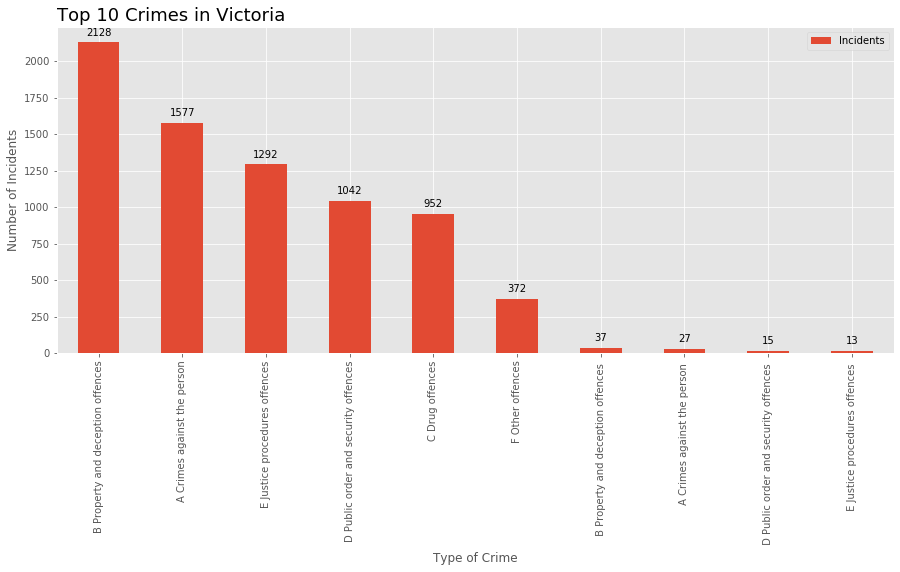

In [99]:
df_4plot1 = df_top10[['Offence','Incidents']]

df_4plot1.set_index('Offence',inplace = True)

ax = df_4plot1.plot(kind='bar', figsize=(15, 6), rot=0)

ax.set_ylabel('Number of Incidents') # add to x-label to the plot
ax.set_xlabel('Type of Crime') # add y-label to the plot
ax.set_title('Top 10 Crimes in Victoria', loc='left', fontsize=18) # add title to the plot

# Creating a function to display the percentage.

for p in ax.patches:
    ax.annotate(np.round(p.get_height(),decimals=2), 
                (p.get_x()+p.get_width()/2., p.get_height()), 
                ha='center', 
                va='center', 
                xytext=(0, 10), 
                textcoords='offset points',
                fontsize = 10
               )

plt.ylim(bottom=0)
plt.xticks(rotation=90)
plt.show()

### Our case is for new families, so lets pick up the suburbs which only have good ratings

In [102]:
df_viccrime_good = df_307CrimeData.drop(["Latitude", "Longitude"], axis=1)
df_viccrime_good = df_viccrime_good.groupby(['Suburb'])['Incidents'].sum().reset_index()
df_viccrime_good = df_viccrime_good.sort_values(['Incidents'], ascending = True, axis = 0)

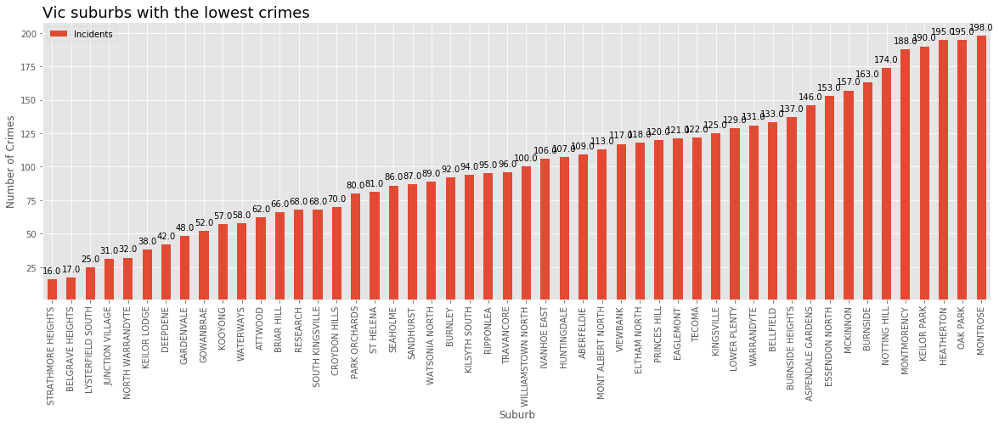

In [107]:
df_viccrime_g50 = df_viccrime_good.head(50)

df_4plot1 = df_viccrime_g50[['Suburb','Incidents']]

df_4plot1.set_index('Suburb',inplace = True)

ax = df_4plot1.plot(kind='bar', figsize=(20, 6), rot=0)

ax.set_ylabel('Number of Crimes') # add to x-label to the plot
ax.set_xlabel('Suburb') # add y-label to the plot
ax.set_title('Vic suburbs with the lowest crimes', loc='left', fontsize=18) # add title to the plot

# Creating a function to display the percentage.

for p in ax.patches:
    ax.annotate(np.round(p.get_height(),decimals=2), 
                (p.get_x()+p.get_width()/2., p.get_height()), 
                ha='center', 
                va='center', 
                xytext=(0, 10), 
                textcoords='offset points',
                fontsize = 10
               )

plt.ylim(bottom=1)
plt.xticks(rotation=90)
plt.show()

### Reading from some off these suburbs, they are really far away from Melbourne Suburb. Now is probably the time for us to integrate this data with folium maps to see what is where

In [140]:
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster
from folium import plugins
from folium import plugins
from folium.plugins import HeatMap

### Lets display Melbourne on a map

In [154]:
# create map and display it
#VIC_map = folium.Map(location=[latitude, longitude], zoom_start=13)
VIC_map = folium.Map(location=[-37.8142176, 144.9631608], zoom_start=13)
#-37.8142176, 144.9631608

# display the map of Melbourne VIc
VIC_map

### Create a folium map with a different colour per crime

#### Colour each of the top 10 crimes with different colour and plot on the map

In [115]:

# Create a list of the 3 most commonly occuring crimes
top_ten_crimes = df[['Offence', 'Incidents']].groupby(
    ['Offence']).count().sort_values('Incidents', ascending=False)[:10].axes[0].tolist()

# Create a list of the 3 most commonly occuring crimes
top_three_crimes = df[['Offence', 'Incidents']].groupby(
    ['Offence']).count().sort_values('Incidents', ascending=False)[:3].axes[0].tolist()

In [116]:

# Create a list of 10 colours. 
# We have  list of the top 10 crimes from earlier
colors10 = [
    'red',
    'blue',
    'gray',
    'orange',
    'beige',
    'green',
    'purple',
    'pink',
    'cadetblue',
    'black'
]

# Create a dictionary of colours to map to the crimes
dict_colours10 = dict(zip(top_ten_crimes, colors10))

# Create a list of 3 colours. 
# We have  list of the top 3 crimes from earlier
colors3 = [
    'red',
    'blue',
    'green'
]

# Create a dictionary of colours to map to the crimes
dict_colours3 = dict(zip(top_three_crimes, colors3))

In [ ]:
# Create a new data frame with just the top 10 crimes
df_top10_crimes = df[df['Offence'].isin(top_ten_crimes)].copy()

# Create a new data frame with just the top 3 crimes
df_top3_crimes = df[df['Offence'].isin(top_three_crimes)].copy()

In [128]:
#create a copy of the data for 307 suburbs, lets us not map it for all of victoria
df_307Color = df_307CrimeData

In [130]:
# Add the colours colums to the df_top_crimes DataFrame
df_307Color['colour'] = df_top10_crimes.Offence.map(dict_colours10)

In [146]:
#create a copy of the data for all suburbs, lets us map it for all of victoria
df_Color = df_viccrimedata

# Add the colours colums to the df_top_crimes DataFrame
df_Color['colour'] = df_top10_crimes.Offence.map(dict_colours10)

In [131]:
df_307Color.head()

,Suburb,Offence,Incidents,Latitude,Longitude,colour
0,SOUTH YARRA,A Crimes against the person,292.0,-37.840679,144.991264,purple
1,SOUTH YARRA,B Property and deception offences,1545.0,-37.840679,144.991264,blue
2,SOUTH YARRA,C Drug offences,91.0,-37.840679,144.991264,red
3,SOUTH YARRA,D Public order and security offences,108.0,-37.840679,144.991264,beige
4,SOUTH YARRA,E Justice procedures offences,167.0,-37.840679,144.991264,orange


In [147]:
df_Color.head()

,Suburb,Offence,Incidents,Latitude,Longitude,colour
0,ABBEYARD,B Property and deception offences,1,-36.554037,146.827590,purple
1,ABBOTSFORD,A Crimes against the person,137,-37.803515,144.998203,blue
2,ABBOTSFORD,B Property and deception offences,891,-37.803515,144.998203,red
3,ABBOTSFORD,C Drug offences,68,-37.803515,144.998203,beige
4,ABBOTSFORD,D Public order and security offences,80,-37.803515,144.998203,orange


### Marker Map of the Top 10 Crimes in Top 307 Victorian Suburbs

In [134]:
# create map and display it
VIC_map = folium.Map(location=[-37.8142176, 144.9631608], zoom_start=11)
#-37.8142176, 144.9631608

# display the map of Melbourne VIc
VIC_map

# Instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

# loop through the August crimes and add each to the incidents feature group
for lat, lng, col in zip(df_307Color.Latitude, 
                         df_307Color.Longitude, 
                         df_307Color.colour):
    incidents.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=1, # define how big you want the circle markers to be
            color=col,
            fill=True,
            fill_color=col,
            fill_opacity=0.6
        )
    )

# add incidents to map
VIC_map.add_child(incidents)

#### Lets use the same data to a cluster map

In [139]:

mc = MarkerCluster()

# Define the world map centered around Melbourne with a higher zoom level
VIC_clust = folium.Map(location=[-37.8142176, 144.9631608], zoom_start=11)

# display world map
VIC_clust

#creating a Marker for each point in df_sample. Each point will get a popup with their zip
for row in df_307Color.itertuples():
    mc.add_child(folium.Marker(
        location=[row.Latitude,  row.Longitude],
                 popup=row.Offence))
 
VIC_clust.add_child(mc)
VIC_clust

#### This is a fantastic view of all the crimes in and around Melbourne. And we will finally create a heat map

In [141]:
VIC_heat = folium.Map(location=[-37.8142176, 144.9631608], zoom_start=11)

# List comprehension to make out list of lists
heat_data = [[row['Latitude'], 
              row['Longitude']] for index, row in df_307Color.iterrows()]

# Plot it on the map
HeatMap(heat_data,
        min_opacity=0.5,
        max_zoom=18, 
        max_val=1.0, 
        radius=15,
        blur=20,
        gradient=None,
        overlay=True).add_to(VIC_heat)

# Display the map
VIC_heat

### Marker Map of the Top 10 Crimes in all of Victorian Suburbs

In [148]:
# create map and display it
VIC_map = folium.Map(location=[-37.8142176, 144.9631608], zoom_start=10)
#-37.8142176, 144.9631608

# display the map of Melbourne VIc
VIC_map

# Instantiate a feature group for the incidents in the dataframe
incidents = folium.map.FeatureGroup()

# loop through the August crimes and add each to the incidents feature group
for lat, lng, col in zip(df_Color.Latitude, 
                         df_Color.Longitude, 
                         df_Color.colour):
    incidents.add_child(
        folium.features.CircleMarker(
            [lat, lng],
            radius=1, # define how big you want the circle markers to be
            color=col,
            fill=True,
            fill_color=col,
            fill_opacity=0.6
        )
    )

# add incidents to map
VIC_map.add_child(incidents)

In [150]:
mc = MarkerCluster()

# Define the world map centered around Melbourne with a higher zoom level
VIC_clust = folium.Map(location=[-37.8142176, 144.9631608], zoom_start=10)

# display world map
VIC_clust

#creating a Marker for each point in df_sample. Each point will get a popup with their zip
for row in df_Color.itertuples():
    mc.add_child(folium.Marker(
        location=[row.Latitude,  row.Longitude],
                 popup=row.Offence))
 
VIC_clust.add_child(mc)
VIC_clust

In [151]:
VIC_heat = folium.Map(location=[-37.8142176, 144.9631608], zoom_start=9)

# List comprehension to make out list of lists
heat_data = [[row['Latitude'], 
              row['Longitude']] for index, row in df_Color.iterrows()]

# Plot it on the map
HeatMap(heat_data,
        min_opacity=0.5,
        max_zoom=18, 
        max_val=1.0, 
        radius=15,
        blur=20,
        gradient=None,
        overlay=True).add_to(VIC_heat)

# Display the map
VIC_heat

# Import Foursquare Data

In [153]:
import requests
import yaml

In [156]:
!conda install -c anaconda beautifulsoup4 --yes
from bs4 import BeautifulSoup

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.5.11
  latest version: 4.8.2

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs: 
    - beautifulsoup4


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    numpy-base-1.15.4          |   py36h81de0dd_0         4.2 MB  anaconda
    beautifulsoup4-4.8.2       |           py36_0         161 KB  anaconda
    numpy-1.15.4               |   py36h1d66e8a_0          35 KB  anaconda
    openssl-1.1.1              |       h7b6447c_0         5.0 MB  anaconda
    soupsieve-1.9.5            |           py36_0          61 KB  anaconda
    mkl_fft-1.0.6              |   py36h7dd41cf_0         150 KB  anaconda
    certifi-2019.11.28         |           py36_0         156 KB  an

In [158]:
CLIENT_ID = 'OIO3EWGF14US4BVQJP1GTKVTIBM1JWYVIMDPTQO5MGHHOW1H' # your Foursquare ID
CLIENT_SECRET = 'QXZ3TIWXKZ5TQSKDADUMM4402FXU4QKY2K00YFRFZLXLONFO' # your Foursquare Secret
VERSION = '20180604'
LIMIT = 30

### FourSquare Top 30 Venues to Visit in Melbourne

FourSquare does not actually provide an API that will return a list of the top venues to visit in a city. To get this list we can though use the FourSquare website directly to request the top sites in Melbourne and then use BeautifulSoup to scrape the data we need. Once we have this starting data the other supplemental data we need to complete this dataset can be retrieved from using the FourSquare Venue API.

In [157]:
# Use the Requests get method to request the top sites in Chicago
page = requests.get(
    "https://foursquare.com/explore?mode=url&ne=-37.507547%2C145.478897&q=Top%20Picks&sw=-38.102144%2C144.560165")

# Convert the HTML response into a BeautifulSoup Object
soup = BeautifulSoup(page.content, 'html.parser')

# Use the BeautifulSoup find_all method to extract each top site venue details.
top_venues = soup.find_all('div', class_='venueDetails')

### Create Top Venues Dataframe

The top_venues list, a sample of which is shown above, only contains some of the data required. In addition to the attributes extracted directly from the HTML code the following attributes are also required:

Venue Address
Venue Postalcode
Venue City
Venue Latitude
Venue Longitude
These attributes will be obtained directly from FourSquare using the venues API. The process is as follows:

Create a new empty Pandas dataframe to hold the data for the Top Sites / Venues
Extract the available attributes from the HTML code
For each venue
Contruct a URL to interagate the FourSquare Venue API for each top site
Using the venues API and the URL request the data from FourSquare
Get the properly formatted address and the latitude and longitude data from the returned JSON
Write the data for each venue to the top venues dataframs

In [159]:
# The column names for the top venues dataframe
venue_columns = ['id', 
                 'score', 
                 'category', 
                 'name', 
                 'address',
                 'postalcode',
                 'city',
                 'href', 
                 'latitude', 
                 'longitude']

# Create the empty top venues dataframe
df_top_venues = pd.DataFrame(columns=venue_columns)

# For each venue in the BeautifulSoup HTML object
for venue in top_venues:
    
    # Extract the available attributes
    venue_name = venue.find(target="_blank").get_text()
    venue_score = venue.find(class_="venueScore positive").get_text()
    venue_cat = venue.find(class_="categoryName").get_text()
    venue_href = venue.find(class_="venueName").h2.a['href']
    venue_id = venue_href.split('/')[-1]

    if 'promotedTipId' in venue_id: 
        continue

    # Contruct the FourSquare venue API URL
    url = 'https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}'.format(
        venue_id, 
        CLIENT_ID,
        CLIENT_SECRET,
        VERSION)
    
    # Request the venue data
    result = requests.get(url).json()
        
    # Get the properly formatted address and the latitude and longitude
    venue_address = result['response']['venue']['location']['address']
    venue_postalcode = result['response']['venue']['location']['postalCode']
    venue_city = result['response']['venue']['location']['city']
    venue_latitude = result['response']['venue']['location']['lat']
    venue_longitude = result['response']['venue']['location']['lng']
    
    # Add the venue to the top venues dataframe
    df_top_venues = df_top_venues.append({'id': venue_id,
                                          'score': venue_score,
                                          'category': venue_cat,
                                          'name': venue_name,
                                          'address': venue_address,
                                          'postalcode': venue_postalcode,
                                          'city': venue_city,
                                          'href': venue_href,
                                          'latitude': venue_latitude,
                                          'longitude': venue_longitude}, ignore_index=True)

In [160]:
# Verify the shape of the top venues dataframe
df_top_venues.shape

(30, 10)

In [161]:
# Verify the dtypes of the top venues dataframe
df_top_venues.dtypes

id             object
score          object
category       object
name           object
address        object
postalcode     object
city           object
href           object
latitude      float64
longitude     float64
dtype: object

In [162]:

# The score type needs to be converted to float
df_top_venues['score'] = pd.to_numeric(df_top_venues['score'], errors='coerce').fillna(0)

# Describe the score to see if there is nuch variance in the values
df_top_venues.score.describe()

count    30.000000
mean      9.226667
std       0.078492
min       9.100000
25%       9.200000
50%       9.200000
75%       9.275000
max       9.400000
Name: score, dtype: float64

In [163]:
# Review the head of the dataframe to make sure it looks as expected
df_top_venues.head()

,id,score,category,name,address,postalcode,city,href,latitude,longitude
0,552db1fd498ef6abfdb29b4c,9.4,Whisky Bar,Boilermaker House,209-211 Lonsdale St,3000,Melbourne,/v/boilermaker-house/552db1fd498ef6abfdb29b4c,-37.811320,144.966155
1,4b19b2c5f964a5203be223e3,9.4,Botanical Garden,Royal Botanic Gardens,Birdwood Ave.,3141,South Yarra,/v/royal-botanic-gardens/4b19b2c5f964a5203be223e3,-37.830938,144.979877
2,4e1433e0d4c023f7053cb276,9.4,Cocktail,The Everleigh,"Level 1, 150-156 Gertrude St",3065,Fitzroy,/v/the-everleigh/4e1433e0d4c023f7053cb276,-37.806079,144.979463
3,4b05874bf964a520ac8922e3,9.3,Art Gallery,National Gallery of Victoria,180 St Kilda Rd,3006,Southbank,/v/national-gallery-of-victoria/4b05874bf964a5...,-37.822483,144.969304
4,52b3f5cc498eb8a07c6efe3c,9.3,Ice Cream,Pidapipó Gelateria,299 Lygon St,3053,Melbourne,/v/pidapip%C3%B3-gelateria/52b3f5cc498eb8a07c6...,-37.798300,144.967060


### FourSquare Restaurant Recommendations Data

In [178]:
# The column names for the restaurants dataframe
restaurants_columns = ['id',
                       'score', 
                       'category', 
                       'categoryID', 
                       'name', 
                       'address',
                       'postalcode',
                       'city',
                       'latitude',
                       'longitude', 
                       'venue_name', 
                       'venue_latitude',
                       'venue_longitude']

# Create the empty top venues dataframe
df_restaurant = pd.DataFrame(columns=restaurants_columns)

# Create a list of all the top venue latitude and longitude
top_venue_lats = df_top_venues['latitude'].values
top_venue_lngs = df_top_venues['longitude'].values

# Create a list of all the top venue names
top_venue_names = df_top_venues['name'].values

# Iterate over each of the top venues
# The venue name, latitude and longitude are passed to the loop
for ven_name, ven_lat, ven_long in zip(top_venue_names, top_venue_lats, top_venue_lngs):
    
    # Configure additional Search parameters
    # This is the FourSquare Category Id for all food venues
    categoryId = '4d4b7105d754a06374d81259'
    radius = 500
    limit = 50
    
        
    # Contruct the FourSquare search API URL
    url = 'https://api.foursquare.com/v2/venues/search?client_id={}&client_secret={}&ll={},{}&v={}&categoryId={}&radius={}&limit={}'.format(
        'R01LINGO2WC45KLRLKT3ZHU2QENAO2IPRK2N2ELOHRNK4P3K',
        '4JT1TWRMXMPLX5IOKNBAFU3L3ARXK4D5JJDPFK1CLRZM2ZVW',
        ven_lat,
        ven_long,
        '20180604',
        categoryId,
        radius,
        limit)
    
    print('url: ', url)
    
    # Make the search request
    results = requests.get(url).json()
    
    # Want a good selection of Restaurents
    # If less than 10 are returned ignore
    if len(results['response']['venues']) < 10:
        continue
        
    # Populate the new dataframe with the list of restaurants
    # Get the values for each Restaurant from the JSON
    for restaurant in results['response']['venues']:
 
        # Sometimes the Venue JSON is missing data. If so ignore and continue
        try:
            # Get location details
            rest_id = restaurant['id']
            rest_category = restaurant['categories'][0]['pluralName']
            rest_categoryID = restaurant['categories'][0]['id']
            rest_name = restaurant['name']
            rest_address = restaurant['location']['address']
            rest_postalcode = restaurant['location']['postalCode']
            rest_city = restaurant['location']['city']
            rest_latitude = restaurant['location']['lat']
            rest_longitude = restaurant['location']['lng']
            
            # Contruct the FourSquare venue API URL to get the venues rating / score
            rest_url = 'https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&v={}'.format(
                rest_id, 
                'R01LINGO2WC45KLRLKT3ZHU2QENAO2IPRK2N2ELOHRNK4P3K',
                '4JT1TWRMXMPLX5IOKNBAFU3L3ARXK4D5JJDPFK1CLRZM2ZVW',
                '20180604')

            # Get the restaurant score and href
            result = requests.get(rest_url).json()
            rest_score = result['response']['venue']['rating']
            
            # Add the restaurant details to the dataframe
            df_restaurant = df_restaurant.append({'id': rest_id,
                                                  'score': rest_score,
                                                  'category': rest_category,
                                                  'categoryID': rest_categoryID,
                                                  'name': rest_name,
                                                  'address': rest_address,
                                                  'postalcode': rest_postalcode,
                                                  'city': rest_city,
                                                  'latitude': rest_latitude,
                                                  'longitude': rest_longitude,
                                                  'venue_name': ven_name,
                                                  'venue_latitude': ven_lat,
                                                  'venue_longitude': ven_long}, ignore_index=True)
            
        # If there are any issue with a restaurant ignore and continue
        except:
            continue

url:  https://api.foursquare.com/v2/venues/search?client_id=R01LINGO2WC45KLRLKT3ZHU2QENAO2IPRK2N2ELOHRNK4P3K&client_secret=4JT1TWRMXMPLX5IOKNBAFU3L3ARXK4D5JJDPFK1CLRZM2ZVW&ll=-37.81132,144.966155&v=20180604&categoryId=4d4b7105d754a06374d81259&radius=500&limit=50
url:  https://api.foursquare.com/v2/venues/search?client_id=R01LINGO2WC45KLRLKT3ZHU2QENAO2IPRK2N2ELOHRNK4P3K&client_secret=4JT1TWRMXMPLX5IOKNBAFU3L3ARXK4D5JJDPFK1CLRZM2ZVW&ll=-37.83093781796033,144.97987747192383&v=20180604&categoryId=4d4b7105d754a06374d81259&radius=500&limit=50
url:  https://api.foursquare.com/v2/venues/search?client_id=R01LINGO2WC45KLRLKT3ZHU2QENAO2IPRK2N2ELOHRNK4P3K&client_secret=4JT1TWRMXMPLX5IOKNBAFU3L3ARXK4D5JJDPFK1CLRZM2ZVW&ll=-37.806079,144.979463&v=20180604&categoryId=4d4b7105d754a06374d81259&radius=500&limit=50
url:  https://api.foursquare.com/v2/venues/search?client_id=R01LINGO2WC45KLRLKT3ZHU2QENAO2IPRK2N2ELOHRNK4P3K&client_secret=4JT1TWRMXMPLX5IOKNBAFU3L3ARXK4D5JJDPFK1CLRZM2ZVW&ll=-37.82248302543171

In [179]:
# Verify the shape of the restaurants dataframe
df_restaurant.shape

(421, 13)

In [180]:

# Review the head of the dataframe to make sure it looks as expected
df_restaurant.head()

,id,score,category,categoryID,name,address,postalcode,city,latitude,longitude,venue_name,venue_latitude,venue_longitude
0,4b1104e7f964a520817723e3,7.6,Dessert Shops,4bf58dd8d48988d1d0941735,Max Brenner Chocolate Bar,Shop 25-27 Red Cape Ln,3000,Melbourne,-37.810692,144.965691,Boilermaker House,-37.81132,144.966155
1,4b0e7e43f964a520015823e3,7.9,Greek Restaurants,4bf58dd8d48988d10e941735,Stalactites,183 Lonsdale St,3000,Melbourne,-37.810870,144.967065,Boilermaker House,-37.81132,144.966155
2,548e129b498e3012587f3e5c,9.3,Coffee Shops,4bf58dd8d48988d1e0931735,Little Rogue Coffee,20 Drewery Ln,3000,Melbourne,-37.810911,144.964027,Boilermaker House,-37.81132,144.966155
3,557faa14498e003d0f96b102,7.5,Dumpling Restaurants,4bf58dd8d48988d108941735,Din Tai Fung 鼎泰豐,"Level 4, Emporium Melbourne, 287 Lonsdale Street",3000,Melbourne CBD,-37.812414,144.964077,Boilermaker House,-37.81132,144.966155
4,535f0e49498e02d827e232fa,8.2,Coffee Shops,4bf58dd8d48988d1e0931735,Nespresso Boutique,"Store 30, Ground Floor, 287 Lonsdale Street",3000,Melbourne,-37.812153,144.963730,Boilermaker House,-37.81132,144.966155


In [181]:
# How many of the top 30 sites / venues had > 10 restaurants nearby
df_restaurant.venue_name.nunique()

12

In [182]:
# How many unique restaurant categories are there
df_restaurant.category.nunique()

62

In [183]:
# How many unique restaurants are there
df_restaurant.name.nunique()

204

In [184]:
# What arethe top 10 most frequently occuring restaurant types
df_restaurant.groupby('category')['name'].count().sort_values(ascending=False)[:10]

category
Coffee Shops              63
Cafés                     57
Bars                      27
Food Courts               24
Dessert Shops             17
Japanese Restaurants      15
Burger Joints             14
Italian Restaurants       13
Australian Restaurants    12
Fast Food Restaurants     11
Name: name, dtype: int64

In [185]:
# Which restaurants have to highest average score
df_restaurant.groupby('category')['score'].mean().sort_values(ascending=False)[:10]

category
Frozen Yogurt Shops               8.900000
Asian Restaurants                 8.866667
Vegetarian / Vegan Restaurants    8.800000
Delis / Bodegas                   8.800000
Grocery Stores                    8.700000
French Restaurants                8.700000
Indian Restaurants                8.700000
Cheese Shops                      8.600000
Food Trucks                       8.600000
Ice Cream Shops                   8.428571
Name: score, dtype: float64

# Inferential Statistical Testing

Inferential statistics allows us to provide insight on a given topic. There are many types of statistical tests that allows one to make inferences. Some of the common statistical tests are:

Correlations
Chi-square test
Independent t-test (a.k.a Student’s t-test)
Paired sample t-test
Welch’s t-test
Wilcoxon signed-rank test
Linear regression
Logistic regression
One-way Analysis of Variance (ANOVA)
Two-way/N-way ANOVA
In this section we will investigate if there are any obvious inferential statisticical methods that can help us when modelling the data.

In [187]:
df_307CrimeData.head()

,Suburb,Offence,Incidents,Latitude,Longitude,colour
0,SOUTH YARRA,A Crimes against the person,292.0,-37.840679,144.991264,purple
1,SOUTH YARRA,B Property and deception offences,1545.0,-37.840679,144.991264,blue
2,SOUTH YARRA,C Drug offences,91.0,-37.840679,144.991264,red
3,SOUTH YARRA,D Public order and security offences,108.0,-37.840679,144.991264,beige
4,SOUTH YARRA,E Justice procedures offences,167.0,-37.840679,144.991264,orange


In [188]:
df_crimeward_crosstab = pd.crosstab(df_307CrimeData.Offence, df_307CrimeData.Suburb)

In [195]:
df_crimeward_crosstab.head()

Suburb,ABBOTSFORD,ABERFELDIE,ALBION,ALPHINGTON,ALTONA,ARDEER,ARMADALE,ASCOT VALE,ASHBURTON,ASPENDALE,ASPENDALE GARDENS,ATTWOOD,AVONDALE HEIGHTS,BALACLAVA,BALWYN NORTH,BAYSWATER NORTH,BEAUMARIS,BELGRAVE HEIGHTS,BELLFIELD,BENTLEIGH,BENTLEIGH EAST,BERWICK,BLACKBURN,BONBEACH,BORONIA,BOX HILL SOUTH,BRIAR HILL,BRIGHTON,BRIGHTON EAST,BROADMEADOWS,BROOKLYN,BRUNSWICK,BRUNSWICK EAST,BRUNSWICK WEST,BULLEEN,BUNDOORA,BURNLEY,BURNSIDE,BURNSIDE HEIGHTS,BURWOOD,CAIRNLEA,CAMPBELLFIELD,CANTERBURY,CARLTON,CARNEGIE,CAROLINE SPRINGS,CARRUM,CAULFIELD,CAULFIELD EAST,CAULFIELD NORTH,CAULFIELD SOUTH,CHELSEA,CHELSEA HEIGHTS,CHELTENHAM,CLARINDA,CLAYTON,CLAYTON SOUTH,CLIFTON HILL,COBURG NORTH,COLLINGWOOD,COOLAROO,CRANBOURNE,CRANBOURNE NORTH,CREMORNE,CROYDON,CROYDON HILLS,DALLAS,DANDENONG,DANDENONG NORTH,DEEPDENE,DEER PARK,DERRIMUT,DIAMOND CREEK,DINGLEY VILLAGE,DOCKLANDS,DONCASTER,DONCASTER EAST,DONVALE,DOVETON,EAGLEMONT,EAST MELBOURNE,EDITHVALE,ELSTERNWICK,ELTHAM,ELTHAM NORTH,ELWOOD,ENDEAVOUR HILLS,EPPING,ESSENDON,ESSENDON NORTH,EUMEMMERRING,FAIRFIELD,FAWKNER,FERNTREE GULLY,FITZROY,FITZROY NORTH,FLEMINGTON,FOOTSCRAY,FRANKSTON NORTH,GARDENVALE,GLADSTONE PARK,GLEN IRIS,GLENROY,GOWANBRAE,GREENSBOROUGH,HADFIELD,HAMPTON EAST,HAMPTON PARK,HAWTHORN,HEATHERTON,HEATHMONT,HEIDELBERG,HEIDELBERG HEIGHTS,HEIDELBERG WEST,HILLSIDE,HOPPERS CROSSING,HUGHESDALE,HUNTINGDALE,IVANHOE,IVANHOE EAST,JACANA,JUNCTION VILLAGE,KEALBA,KEILOR,KEILOR DOWNS,KEILOR EAST,KEILOR LODGE,KEILOR PARK,KEW,KEYSBOROUGH,KILSYTH,KILSYTH SOUTH,KINGS PARK,KINGSBURY,KINGSVILLE,KNOXFIELD,KOOYONG,LALOR,LANGWARRIN,LILYDALE,LOWER PLENTY,LYNBROOK,LYSTERFIELD SOUTH,MACLEOD,MAIDSTONE,MALVERN EAST,MARIBYRNONG,MCKINNON,MEADOW HEIGHTS,MELBOURNE,MENTONE,MILL PARK,MONT ALBERT NORTH,MONTMORENCY,MONTROSE,MOONEE PONDS,MOOROOLBARK,MORDIALLOC,MOUNT WAVERLEY,MULGRAVE,NARRE WARREN,NARRE WARREN NORTH,NARRE WARREN SOUTH,NEWPORT,NOBLE PARK NORTH,NORTH MELBOURNE,NORTH WARRANDYTE,NORTHCOTE,NOTTING HILL,OAK PARK,OAKLEIGH,OAKLEIGH EAST,OAKLEIGH SOUTH,ORMOND,PARK ORCHARDS,PARKDALE,PARKVILLE,PASCOE VALE SOUTH,POINT COOK,PORT MELBOURNE,PRAHRAN,PRINCES HILL,RESEARCH,RICHMOND,RINGWOOD,RINGWOOD EAST,RINGWOOD NORTH,RIPPONLEA,ROSANNA,ROWVILLE,ROXBURGH PARK,SANDHURST,SANDRINGHAM,SCORESBY,SEAHOLME,SEDDON,SOUTH KINGSVILLE,SOUTH MELBOURNE,SOUTH MORANG,SOUTH YARRA,SOUTHBANK,SPOTSWOOD,SPRINGVALE,SPRINGVALE SOUTH,ST ALBANS,ST HELENA,ST KILDA,STRATHMORE,STRATHMORE HEIGHTS,SUNSHINE NORTH,SUNSHINE WEST,SURREY HILLS,SYDENHAM,TAYLORS HILL,TAYLORS LAKES,TECOMA,TEMPLESTOWE,TEMPLESTOWE LOWER,THE BASIN,THOMASTOWN,THORNBURY,TRAVANCORE,TULLAMARINE,UPPER FERNTREE GULLY,UPWEY,VERMONT,VERMONT SOUTH,VIEWBANK,WANTIRNA,WANTIRNA SOUTH,WARRANDYTE,WATERWAYS,WATSONIA,WATSONIA NORTH,WERRIBEE,WEST FOOTSCRAY,WEST MELBOURNE,WESTMEADOWS,WHEELERS HILL,WILLIAMS LANDING,WILLIAMSTOWN,WILLIAMSTOWN NORTH,WINDSOR,YARRAVILLE
Offence,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
A Crimes against the person,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1
B Property and deception offences,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1

In [189]:
df_top_venues.head()

,id,score,category,name,address,postalcode,city,href,latitude,longitude
0,552db1fd498ef6abfdb29b4c,9.4,Whisky Bar,Boilermaker House,209-211 Lonsdale St,3000,Melbourne,/v/boilermaker-house/552db1fd498ef6abfdb29b4c,-37.811320,144.966155
1,4b19b2c5f964a5203be223e3,9.4,Botanical Garden,Royal Botanic Gardens,Birdwood Ave.,3141,South Yarra,/v/royal-botanic-gardens/4b19b2c5f964a5203be223e3,-37.830938,144.979877
2,4e1433e0d4c023f7053cb276,9.4,Cocktail,The Everleigh,"Level 1, 150-156 Gertrude St",3065,Fitzroy,/v/the-everleigh/4e1433e0d4c023f7053cb276,-37.806079,144.979463
3,4b05874bf964a520ac8922e3,9.3,Art Gallery,National Gallery of Victoria,180 St Kilda Rd,3006,Southbank,/v/national-gallery-of-victoria/4b05874bf964a5...,-37.822483,144.969304
4,52b3f5cc498eb8a07c6efe3c,9.3,Ice Cream,Pidapipó Gelateria,299 Lygon St,3053,Melbourne,/v/pidapip%C3%B3-gelateria/52b3f5cc498eb8a07c6...,-37.798300,144.967060


Text(0.0, 1.0, 'Scatter Plot of Top Venues Latitude and Score')

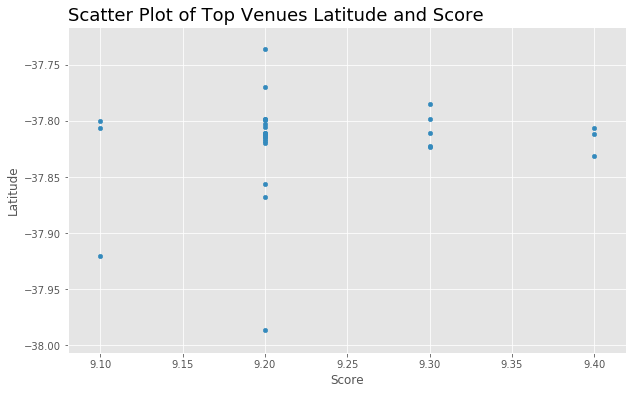

In [190]:

df_top_venues.plot.scatter('score', 'latitude', figsize=(10,6))

plt.xlabel('Score')
plt.ylabel('Latitude')
plt.title('Scatter Plot of Top Venues Latitude and Score', loc='left', fontsize=18)

Text(0.0, 1.0, 'Scatter Plot of Top Venues Longitude and Score')

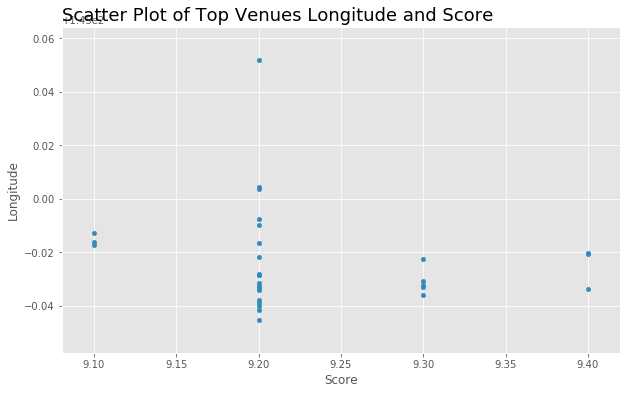

In [191]:
df_top_venues.plot.scatter('score', 'longitude', figsize=(10,6))

plt.xlabel('Score')
plt.ylabel('Longitude')
plt.title('Scatter Plot of Top Venues Longitude and Score', loc='left', fontsize=18)

In [192]:
df_rest.head()

,id,score,category,categoryID,name,address,postalcode,city,latitude,longitude,venue_name,venue_latitude,venue_longitude
0,4b1104e7f964a520817723e3,7.6,Dessert Shops,4bf58dd8d48988d1d0941735,Max Brenner Chocolate Bar,Shop 25-27 Red Cape Ln,3000,Melbourne,-37.810692,144.965691,Boilermaker House,-37.81132,144.966155
1,4b0e7e43f964a520015823e3,7.9,Greek Restaurants,4bf58dd8d48988d10e941735,Stalactites,183 Lonsdale St,3000,Melbourne,-37.810870,144.967065,Boilermaker House,-37.81132,144.966155
2,548e129b498e3012587f3e5c,9.3,Coffee Shops,4bf58dd8d48988d1e0931735,Little Rogue Coffee,20 Drewery Ln,3000,Melbourne,-37.810911,144.964027,Boilermaker House,-37.81132,144.966155
3,557faa14498e003d0f96b102,7.5,Dumpling Restaurants,4bf58dd8d48988d108941735,Din Tai Fung 鼎泰豐,"Level 4, Emporium Melbourne, 287 Lonsdale Street",3000,Melbourne CBD,-37.812414,144.964077,Boilermaker House,-37.81132,144.966155
4,535f0e49498e02d827e232fa,8.2,Coffee Shops,4bf58dd8d48988d1e0931735,Nespresso Boutique,"Store 30, Ground Floor, 287 Lonsdale Street",3000,Melbourne,-37.812153,144.963730,Boilermaker House,-37.81132,144.966155


Text(0.0, 1.0, 'Scatter Plot of Restaurants Latitude and Score')

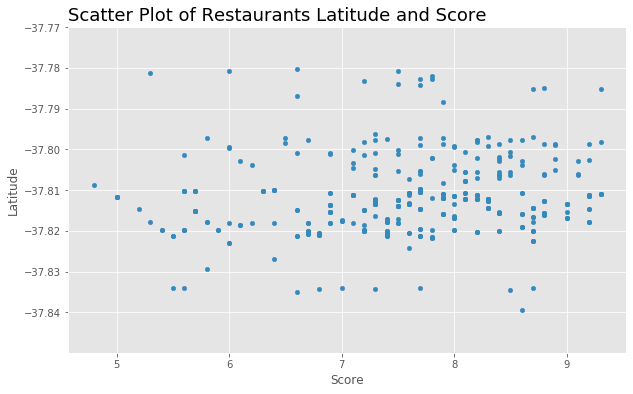

In [193]:
df_restaurant.plot.scatter('score', 'latitude', figsize=(10,6))

plt.xlabel('Score')
plt.ylabel('Latitude')
plt.title('Scatter Plot of Restaurants Latitude and Score', loc='left', fontsize=18)

Text(0.0, 1.0, 'Scatter Plot of Restaurants Longitude and Score')

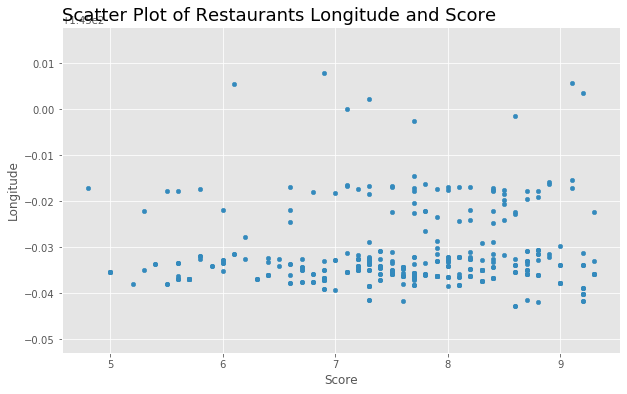

In [194]:
df_restaurant.plot.scatter('score', 'longitude', figsize=(10,6))

plt.xlabel('Score')
plt.ylabel('Longitude')
plt.title('Scatter Plot of Restaurants Longitude and Score', loc='left', fontsize=18)

### Cleanse data for further processing

In [204]:
df_topVen = df_top_venues 
df_rest = df_restaurant

In [206]:
df_topVen.tail(20)

,id,score,category,name,address,postalcode,city,href,latitude,longitude
10,5acdd1679d6a195ad563ff3a,9.2,Ice Cream,Pidapipó Gelateria,8 Degraves St,3000,Melbourne,/v/pidapip%C3%B3-gelateria/5acdd1679d6a195ad56...,-37.817715,144.965997
11,4b0f05b3f964a520475e23e3,9.2,Vegetarian / Vegan,Lentil As Anything,Abbotsford Convent,3067,Melbourne,/v/lentil-as-anything/4b0f05b3f964a520475e23e3,-37.802724,145.003507
12,54b629b2498eb25a34354f3c,9.2,Cocktail,Union Electric,Heffernan Ln,3000,Melbourne,/v/union-electric/54b629b2498eb25a34354f3c,-37.811798,144.966687
13,4c73988457b6a143fa76c8cc,9.2,Bar,Naked For Satan,285 Brunswick St.,3065,Melbourne,/v/naked-for-satan/4c73988457b6a143fa76c8cc,-37.798922,144.978169
14,4b077ff0f964a5203efe22e3,9.2,Pub,The Local Taphouse,184 Carlisle St.,3182,St Kilda,/v/the-local-taphouse/4b077ff0f964a5203efe22e3,-37.868158,144.990040
15,4b171e71f964a5209bc223e3,9.2,Beach,Mentone Beach,Beach Road,3194,Mentone,/v/mentone-beach/4b171e71f964a5209bc223e3,-37.986489,145.051940
16,4b29d3f0f964a52096a324e3,9.2,Bar,Mr Wilkinson,295 Lygon St,3056,Melbourne,/v/mr-wilkinson/4b29d3f0f964a52096a324e3,-37.769401,144.971969
17,5039709be4b021b479978a7a,9.2,Café,School of 7 Bells,33 Chapel St,3181,Melbourne,/v/school-of-7-bells/5039709be4b021b479978a7a,-37.856064,144.992450
18,4b058749f964a520128922e3,9.2,Park,Carlton Gardens,111 Carlton St.,3053,Carlton,/v/carlton-gardens/4b058749f964a520128922e3,-37.805376,144.971466
19,55b4b501498e1138097ca82f,9.2,BBQ,Dexter,456 High St,3072,Melbourne,/v/dexter/55b4b501498e1138097ca82f,-37.736142,145.004417


In [207]:
#Cleans data of single quotes, commas and other characters

df_topVen['name'] = df_topVen['name'].str.replace("'",'')
df_topVen['name'] = df_topVen['name'].str.replace("&",' and ')
df_topVen['name'] = df_topVen['name'].str.replace(",",'')

In [208]:
df_topVen.tail(20)

,id,score,category,name,address,postalcode,city,href,latitude,longitude
10,5acdd1679d6a195ad563ff3a,9.2,Ice Cream,Pidapipó Gelateria,8 Degraves St,3000,Melbourne,/v/pidapip%C3%B3-gelateria/5acdd1679d6a195ad56...,-37.817715,144.965997
11,4b0f05b3f964a520475e23e3,9.2,Vegetarian / Vegan,Lentil As Anything,Abbotsford Convent,3067,Melbourne,/v/lentil-as-anything/4b0f05b3f964a520475e23e3,-37.802724,145.003507
12,54b629b2498eb25a34354f3c,9.2,Cocktail,Union Electric,Heffernan Ln,3000,Melbourne,/v/union-electric/54b629b2498eb25a34354f3c,-37.811798,144.966687
13,4c73988457b6a143fa76c8cc,9.2,Bar,Naked For Satan,285 Brunswick St.,3065,Melbourne,/v/naked-for-satan/4c73988457b6a143fa76c8cc,-37.798922,144.978169
14,4b077ff0f964a5203efe22e3,9.2,Pub,The Local Taphouse,184 Carlisle St.,3182,St Kilda,/v/the-local-taphouse/4b077ff0f964a5203efe22e3,-37.868158,144.990040
15,4b171e71f964a5209bc223e3,9.2,Beach,Mentone Beach,Beach Road,3194,Mentone,/v/mentone-beach/4b171e71f964a5209bc223e3,-37.986489,145.051940
16,4b29d3f0f964a52096a324e3,9.2,Bar,Mr Wilkinson,295 Lygon St,3056,Melbourne,/v/mr-wilkinson/4b29d3f0f964a52096a324e3,-37.769401,144.971969
17,5039709be4b021b479978a7a,9.2,Café,School of 7 Bells,33 Chapel St,3181,Melbourne,/v/school-of-7-bells/5039709be4b021b479978a7a,-37.856064,144.992450
18,4b058749f964a520128922e3,9.2,Park,Carlton Gardens,111 Carlton St.,3053,Carlton,/v/carlton-gardens/4b058749f964a520128922e3,-37.805376,144.971466
19,55b4b501498e1138097ca82f,9.2,BBQ,Dexter,456 High St,3072,Melbourne,/v/dexter/55b4b501498e1138097ca82f,-37.736142,145.004417


In [209]:
# To display the Name correctly need to remove ' and & symbols
df_rest['name'] = df_rest['name'].str.replace("'",'')
df_rest['name'] = df_rest['name'].str.replace("&",' and ')
df_rest['name'] = df_rest['name'].str.replace(",",'')

In [210]:
df_rest.head()

,id,score,category,categoryID,name,address,postalcode,city,latitude,longitude,venue_name,venue_latitude,venue_longitude
0,4b1104e7f964a520817723e3,7.6,Dessert Shops,4bf58dd8d48988d1d0941735,Max Brenner Chocolate Bar,Shop 25-27 Red Cape Ln,3000,Melbourne,-37.810692,144.965691,Boilermaker House,-37.81132,144.966155
1,4b0e7e43f964a520015823e3,7.9,Greek Restaurants,4bf58dd8d48988d10e941735,Stalactites,183 Lonsdale St,3000,Melbourne,-37.810870,144.967065,Boilermaker House,-37.81132,144.966155
2,548e129b498e3012587f3e5c,9.3,Coffee Shops,4bf58dd8d48988d1e0931735,Little Rogue Coffee,20 Drewery Ln,3000,Melbourne,-37.810911,144.964027,Boilermaker House,-37.81132,144.966155
3,557faa14498e003d0f96b102,7.5,Dumpling Restaurants,4bf58dd8d48988d108941735,Din Tai Fung 鼎泰豐,"Level 4, Emporium Melbourne, 287 Lonsdale Street",3000,Melbourne CBD,-37.812414,144.964077,Boilermaker House,-37.81132,144.966155
4,535f0e49498e02d827e232fa,8.2,Coffee Shops,4bf58dd8d48988d1e0931735,Nespresso Boutique,"Store 30, Ground Floor, 287 Lonsdale Street",3000,Melbourne,-37.812153,144.963730,Boilermaker House,-37.81132,144.966155


### Top venues with more than 10 Restaurants nearby

In [211]:
# The Top Venues / Sites from the restaurant dataframe
top_venues_list = df_rest.venue_name.unique().tolist()

In [288]:
df_rest.head()

,index,id,score,category,categoryID,name,address,postalcode,city,latitude,longitude,venue_name,venue_latitude,venue_longitude
0,0,4b1104e7f964a520817723e3,7.6,Dessert Shops,4bf58dd8d48988d1d0941735,Max Brenner Chocolate Bar,Shop 25-27 Red Cape Ln,3000,Melbourne,-37.810692,144.965691,Boilermaker House,-37.81132,144.966155
1,1,4b0e7e43f964a520015823e3,7.9,Greek Restaurants,4bf58dd8d48988d10e941735,Stalactites,183 Lonsdale St,3000,Melbourne,-37.810870,144.967065,Boilermaker House,-37.81132,144.966155
2,2,548e129b498e3012587f3e5c,9.3,Coffee Shops,4bf58dd8d48988d1e0931735,Little Rogue Coffee,20 Drewery Ln,3000,Melbourne,-37.810911,144.964027,Boilermaker House,-37.81132,144.966155
3,3,557faa14498e003d0f96b102,7.5,Dumpling Restaurants,4bf58dd8d48988d108941735,Din Tai Fung 鼎泰豐,"Level 4, Emporium Melbourne, 287 Lonsdale Street",3000,Melbourne CBD,-37.812414,144.964077,Boilermaker House,-37.81132,144.966155
4,4,535f0e49498e02d827e232fa,8.2,Coffee Shops,4bf58dd8d48988d1e0931735,Nespresso Boutique,"Store 30, Ground Floor, 287 Lonsdale Street",3000,Melbourne,-37.812153,144.963730,Boilermaker House,-37.81132,144.966155


In [289]:
df_307CrimeData.head()

,Suburb,Offence,Incidents,Latitude,Longitude,colour
0,SOUTH YARRA,A Crimes against the person,292.0,-37.840679,144.991264,purple
1,SOUTH YARRA,B Property and deception offences,1545.0,-37.840679,144.991264,blue
2,SOUTH YARRA,C Drug offences,91.0,-37.840679,144.991264,red
3,SOUTH YARRA,D Public order and security offences,108.0,-37.840679,144.991264,beige
4,SOUTH YARRA,E Justice procedures offences,167.0,-37.840679,144.991264,orange


In [290]:
#Create a dataset to hold lat long name of restaurants

df_rest_all = df_rest[['name','latitude','longitude']]

In [291]:
df_rest_all.shape

(309, 3)

In [292]:
df_rest_all.head()

,name,latitude,longitude
0,Max Brenner Chocolate Bar,-37.810692,144.965691
1,Stalactites,-37.810870,144.967065
2,Little Rogue Coffee,-37.810911,144.964027
3,Din Tai Fung 鼎泰豐,-37.812414,144.964077
4,Nespresso Boutique,-37.812153,144.963730


In [293]:
#do the same for crime data

df_crime_all = df_307CrimeData[['Latitude', 'Longitude', 'Incidents']]

In [294]:
df_crime_all.head()

,Latitude,Longitude,Incidents
0,-37.840679,144.991264,292.0
1,-37.840679,144.991264,1545.0
2,-37.840679,144.991264,91.0
3,-37.840679,144.991264,108.0
4,-37.840679,144.991264,167.0


In [295]:
#lets group the incident count per location
df_crime_all = df_crime_all.groupby(['Latitude','Longitude'])['Incidents'].sum().reset_index()
df_crime_all.shape

(160, 3)

In [296]:
df_crime_all.head()

,Latitude,Longitude,Incidents
0,-38.365017,144.765920,15834.0
1,-38.156369,145.198328,777.0
2,-38.135253,145.268888,3254.0
3,-38.126458,145.157574,645.0
4,-38.082094,145.208687,87.0


In [298]:
df_crime_all.rename(columns={"Latitude": "latitude", "Longitude": "longitude"}, inplace=True)

In [299]:
df_crime_all.head()

,latitude,longitude,Incidents
0,-38.365017,144.765920,15834.0
1,-38.156369,145.198328,777.0
2,-38.135253,145.268888,3254.0
3,-38.126458,145.157574,645.0
4,-38.082094,145.208687,87.0


In [212]:
# Filter the top venues dataframe using the top venues list
df_top_venues = df_topVen[df_topVen['name'].isin(top_venues_list)]

# Take just the top 10 venues, sorted by score, to reduce to show the concept
df_top10_venues = df_topVen.sort_values('score', ascending=False)[:10]

# Create a list of the top 10 venues names
top10_venues_list = df_top10_venues.name.tolist()

# Finally filter the Restaurants data frame to include only the top 10 venues
df_rest = df_rest[df_rest['venue_name'].isin(top10_venues_list)]

df_rest.reset_index(inplace=True)

In [214]:
# Create a list of the 2 most commonly occuring crimes
top_two_crimes = df_307CrimeData[['Offence', 'Incidents']].groupby(
    ['Offence']).count().sort_values('Incidents', ascending=False)[:2].axes[0].tolist()

# Create a smaller DataFrame of only the top two crimes
df_crimes = df_307CrimeData[df_307CrimeData['Offence'].isin(top_two_crimes)]
df_crimes.reset_index(inplace=True)
df_crimes.drop('index', inplace=True, axis=1)

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/pandas/core/frame.py:4117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [223]:
df_top10_venues.head()

,id,score,category,name,address,postalcode,city,href,latitude,longitude
0,552db1fd498ef6abfdb29b4c,9.4,Whisky Bar,Boilermaker House,209-211 Lonsdale St,3000,Melbourne,/v/boilermaker-house/552db1fd498ef6abfdb29b4c,-37.811320,144.966155
2,4e1433e0d4c023f7053cb276,9.4,Cocktail,The Everleigh,"Level 1, 150-156 Gertrude St",3065,Fitzroy,/v/the-everleigh/4e1433e0d4c023f7053cb276,-37.806079,144.979463
1,4b19b2c5f964a5203be223e3,9.4,Botanical Garden,Royal Botanic Gardens,Birdwood Ave.,3141,South Yarra,/v/royal-botanic-gardens/4b19b2c5f964a5203be223e3,-37.830938,144.979877
3,4b05874bf964a520ac8922e3,9.3,Art Gallery,National Gallery of Victoria,180 St Kilda Rd,3006,Southbank,/v/national-gallery-of-victoria/4b05874bf964a5...,-37.822483,144.969304
4,52b3f5cc498eb8a07c6efe3c,9.3,Ice Cream,Pidapipó Gelateria,299 Lygon St,3053,Melbourne,/v/pidapip%C3%B3-gelateria/52b3f5cc498eb8a07c6...,-37.798300,144.967060


In [267]:
df_crimes.rename(columns={"Latitude": "latitude", "Longitude": "longitude"}, inplace=True)

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/pandas/core/frame.py:4238: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(**kwargs)


In [268]:
df_crimes.shape

(488, 5)

In [269]:
df_crimes.head()

,Suburb,Offence,Incidents,latitude,longitude
0,SOUTH YARRA,A Crimes against the person,292.0,-37.840679,144.991264
1,SOUTH YARRA,B Property and deception offences,1545.0,-37.840679,144.991264
2,EAST MELBOURNE,A Crimes against the person,95.0,-37.818517,144.982207
3,EAST MELBOURNE,B Property and deception offences,344.0,-37.818517,144.982207
4,CARLTON,A Crimes against the person,196.0,-37.803569,144.966112


In [221]:
from sklearn.neighbors import DistanceMetric

In [250]:
# Very useful function to calculate the great circle distance between two points
# used from :
# https://stackoverflow.com/questions/40452759/pandas-latitude-longitude-to-distance-between-successive-rows

def haversine(row):
    dist = DistanceMetric.get_metric('haversine')
   
    lat1, lon1, lat2, lon2 = map(np.radians, [row['latitude'], row['longitude'], row['ven_lat'], row['ven_lon']])

    dlon = lon2 - lon1
    dlat = lat2 - lat1

    a = np.sin(dlat/2.0)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2.0)**2

    c = 2 * np.arcsin(np.sqrt(a))
    km = 6367 * c
    return km

In [272]:
df_dist = pd.DataFrame()

for name, lat, lon in zip(df_top10_venues.name,
                          df_top10_venues.latitude,
                          df_top10_venues.longitude):
    print('Processing: ', name, lat, lon)
    df_temp = df_crimes.copy()   
    df_temp['ven_lat'] = lat
    df_temp['ven_lon'] = lon
#    print(df_temp.head())
 #   print('Processing1: ', name)
    
  
    df_dist[name] = df_temp.apply(haversine, axis=1)

Processing:  Boilermaker House -37.81132 144.966155
Processing:  The Everleigh -37.806079 144.979463
Processing:  Royal Botanic Gardens -37.83093781796033 144.97987747192383
Processing:  National Gallery of Victoria -37.822483025431715 144.9693037194922
Processing:  Pidapipó Gelateria -37.7983 144.96706
Processing:  Little Rogue Coffee -37.810911 144.964027
Processing:  Melbourne Recital Centre -37.823685111092594 144.96759905765907
Processing:  Neighbourhood Wine -37.785133 144.977638
Processing:  Carlton Wine Room -37.798584 144.96861
Processing:  Flagstaff Gardens -37.81037504952484 144.95477631352887


In [273]:
df_dist.head()

,Boilermaker House,The Everleigh,Royal Botanic Gardens,National Gallery of Victoria,Pidapipó Gelateria,Little Rogue Coffee,Melbourne Recital Centre,Neighbourhood Wine,Carlton Wine Room,Flagstaff Gardens
0,3.937186,3.982023,1.473237,2.793485,5.166480,4.081459,2.807178,6.287402,5.082969,4.647338
1,3.937186,3.982023,1.473237,2.793485,5.166480,4.081459,2.807178,6.287402,5.082969,4.647338
2,1.620312,1.403010,1.395329,1.215395,2.610705,1.805989,1.405034,3.731429,2.516256,2.572471
3,1.620312,1.403010,1.395329,1.215395,2.610705,1.805989,1.405034,3.731429,2.516256,2.572471
4,0.861339,1.204950,3.272635,2.120418,0.591405,0.836165,2.239214,2.285080,0.595801,1.250017


### Display each of the Top 10 Venues


In this section a preview of the type of data that will be displayed to a user of the proposed solution is shown.

For each of the Top 10 Venues:

All crimes within 750 meters of the venue are added to a dataframe
All restaurants associated with the venue are added to a dataframe
A folium Map is created centered on the venue
A heatmap of the crimes in the area are overlayed
the venue is marked on the map
The top 10 scored restaurants are marked on the map
It is possible to fully automate this through full iteration but in order to clearly show each of the 10 maps each is generated manually (to a degree).

### Venue 1

In [274]:
# Get the name of the Top Venue for this iteration
top_venue = top10_venues_list[0]

# Create a crime dataframe for the venue
df_crimes_venue = df_crimes.copy()
df_crimes_venue['dist'] = df_dist[top_venue]
df_crimes_venue = df_crimes_venue[df_crimes_venue['dist'] <= 0.75]

In [275]:

# Create a dataframe of the restaurants associated with the venue
df_rest_venue = df_rest[df_rest.venue_name == top_venue].copy()

# Sort the restaurants so we can pick the top 10
df_rest_venue.sort_values('score', ascending=False, inplace=True)

In [276]:
# Define Venue geolocation coordinates
vic_latitude = df_top10_venues.latitude[df_top10_venues.name == top_venue].values[0]  
vic_longitude = df_top10_venues.longitude[df_top10_venues.name == top_venue].values[0]

# Create the Folium Map
vic_heatmat = folium.Map(location=[-37.8142176, 144.9631608], zoom_start=16) 

# List comprehension to make out list of lists of Crime Loatitude and Longitude
heat_data = [[row['latitude'], 
              row['longitude']] for index, row in df_crimes_venue.iterrows()]

# Plot the crimes on the map
HeatMap(heat_data,
        min_opacity=0.5,
        max_zoom=18, 
        max_val=1.0, 
        radius=20,
        blur=30,
        gradient=None,
        overlay=True).add_to(vic_heatmat)

# Add the Venue to the Map
folium.Marker(
    location=[-37.8142176, 144.9631608],
    popup=top_venue,
    icon=folium.Icon(color='blue', icon='info-sign')
).add_to(vic_heatmat)

# Add the Top 10 Restaurants to the map
for row in df_rest_venue[:10].itertuples():
    popup_text = '<h4>' + row.name + '</h4>'
    popup_text = popup_text + '<h5>' + row.category + '</h5>'
    popup_text = popup_text + '<b>Score: </b>' + str(row.score)
    popup = folium.Popup(popup_text)
    folium.Marker([row.latitude, row.longitude], 
                  popup=popup,
                  icon=folium.Icon(color='red', icon='thumbs-up')
                 ).add_to(vic_heatmat)


# Display the map
vic_heatmat

### Venue 3

In [280]:
# Get the name of the Top Venue for this iteration
top_venue = top10_venues_list[2]

# Create a crime dataframe for the venue
df_crimes_venue = df_crimes.copy()
df_crimes_venue['dist'] = df_dist[top_venue]
df_crimes_venue = df_crimes_venue[df_crimes_venue['dist'] <= 0.75]

In [281]:
# Create a dataframe of the restaurants associated with the venue
df_rest_venue = df_rest[df_rest.venue_name == top_venue].copy()

# Sort the restaurants so we can pick the top 10
df_rest_venue.sort_values('score', ascending=False, inplace=True)

In [283]:
# Define Venue geolocation coordinates
vic_latitude = df_top10_venues.latitude[df_top10_venues.name == top_venue].values[0]  
vic_longitude = df_top10_venues.longitude[df_top10_venues.name == top_venue].values[0]

# Create the Folium Map
vic_heatmat = folium.Map(location=[-37.8142176, 144.9631608], zoom_start=16) 

# List comprehension to make out list of lists of Crime Loatitude and Longitude
heat_data = [[row['latitude'], 
              row['longitude']] for index, row in df_crimes_venue.iterrows()]

# Plot the crimes on the map
HeatMap(heat_data,
        min_opacity=0.5,
        max_zoom=18, 
        max_val=1.0, 
        radius=20,
        blur=30,
        gradient=None,
        overlay=True).add_to(vic_heatmat)

# Add the Top 10 Restaurants to the map
for row in df_rest_venue[:10].itertuples():
    popup_text = '<h4>' + row.name + '</h4>'
    popup_text = popup_text + '<h5>' + row.category + '</h5>'
    popup_text = popup_text + '<b>Score: </b>' + str(row.score)
    popup = folium.Popup(popup_text)
    folium.Marker([row.latitude, row.longitude], 
                  popup=popup,
                  icon=folium.Icon(color='red', icon='thumbs-up')
                 ).add_to(vic_heatmat)

# Add the Venue to the Map
folium.Marker(
    location=[-37.8142176, 144.9631608],
    popup=top_venue,
    icon=folium.Icon(color='blue', icon='info-sign')
).add_to(vic_heatmat)

# Display the map
vic_heatmat

## Map incidents heat map with no. of restaurants

In [ ]:
df_incs = 

In [287]:
df_307CrimeData.head()

,Suburb,Offence,Incidents,Latitude,Longitude,colour
0,SOUTH YARRA,A Crimes against the person,292.0,-37.840679,144.991264,purple
1,SOUTH YARRA,B Property and deception offences,1545.0,-37.840679,144.991264,blue
2,SOUTH YARRA,C Drug offences,91.0,-37.840679,144.991264,red
3,SOUTH YARRA,D Public order and security offences,108.0,-37.840679,144.991264,beige
4,SOUTH YARRA,E Justice procedures offences,167.0,-37.840679,144.991264,orange
